In [2]:
import xarray as xr 
import matplotlib.pyplot as plt
import cmocean as cmo 
import pandas as pd 
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import numpy as np


# Start date 
start_date = '2024-08-10'
end_date = pd.to_datetime(start_date) + pd.Timedelta(seconds=(10*9998))
dates = pd.date_range(start_date, end_date, freq='10s')


# python -m ipykernel install --user --name schimpy --display-name Schimpy

In [ ]:
# open datasets

truth = xr.open_dataset('../forward_phyto/phyto_TRUTH.nc', decode_timedelta=False)
guess = xr.open_dataset('../forward_phyto/phyto_GUESS_2.nc', decode_timedelta=False)
# guess2 = xr.open_dataset('../forward_phyto/phyto_GUESS_2.nc', decode_timedelta=False)

hydro = xr.open_dataset('../run_hydro/HYDRO.nc', decode_timedelta=False)
adj   = xr.open_dataset('adjoint_2.nc')


grad = guess["gamma"].values * adj["lambda"].values
z = guess["z"]

In [ ]:
guess2 = xr.open_dataset('../forward_phyto/phyto_GUESS_2.nc', decode_timedelta=False)
guess1 = xr.open_dataset('../forward_phyto/phyto_GUESS.nc', decode_timedelta=False)

true = truth.algae1.values[-1,:]
print(sum(true - guess1.algae1.values[-1,:]))
print(sum(true - guess2.algae1.values[-1,:]))

[0.00583018 0.00601597 0.00619803 0.00637106 0.00651562 0.00663411
 0.00673547 0.00682377 0.00690136 0.00696977 0.00703016 0.00708348
 0.00717191 0.00757889 0.00805074 0.00854155 0.00901687 0.0091443
 0.00922008 0.0092991  0.00938064 0.00946415 0.00954923 0.00963563
 0.00972324 0.00981135 0.00989971 0.00998895 0.01007928 0.01017076
 0.01026352 0.01035776 0.01045375 0.0105414  0.01055741 0.01056594
 0.0105738  0.01058123 0.01059407 0.01064604 0.0106997  0.01075346
 0.01079993 0.01083672 0.01086974 0.01090181 0.01092654 0.0109333
 0.01093728 0.01094107 0.01094471 0.01094821 0.01095175 0.01095817
 0.01099154 0.01104617 0.01112185 0.01113505 0.01114297 0.01115577]
[0.00582697 0.00601265 0.00619461 0.00636755 0.00651202 0.00663045
 0.00673175 0.00682001 0.00689755 0.00696592 0.00702627 0.00707956
 0.00716795 0.00757469 0.00804626 0.00853679 0.00901183 0.00913918
 0.00921492 0.00929389 0.00937539 0.00945885 0.00954388 0.00963023
 0.00971779 0.00980584 0.00989415 0.00998334 0.01007362 0.01016

In [12]:
frames = []

start = 0
end = 8998 
spacing = 6 
times = [dates[i] for i in range(start, end, spacing)]
# Create a frame for each phase shift
for i in range(start, end, spacing):
    h1 = go.Scatter(x=guess["algae1"][i,:], y=-z, name= "Guess", mode='lines', line=dict(width=2, color="blue"))  
    h2 = go.Scatter(x=truth["algae1"][i,:], y=-z, name= "Truth",  mode='lines', line=dict(width=2, color="green"))  
    frames.append(go.Frame(data=[h1, h2], name=str(dates[i])))

# Initial figure
i = 0 
h1 = go.Scatter(x=guess["algae1"][i,:], y=-z, name= "Guess", mode='lines', line=dict(width=2, color="blue"))  
h2 = go.Scatter(x=truth["algae1"][i,:], y=-z, name= "Truth",  mode='lines', line=dict(width=2, color="green"))   
fig = go.Figure( data=[h1, h2],
                layout=go.Layout(
                    title='Algae Concentration in the Water Column',
                    xaxis=dict(range=[0, 1e-1], title='Algae Concentration (cells/mL)'),
                    yaxis=dict(range=[-6, 0], title='Water Depth (m)'),
                    updatemenus=[{
                    'type': 'buttons',
                    'showactive': False,
                    'buttons': [{
                        'label': 'Play',
                        'method': 'animate',
                        'args': [None, {
                            'frame': {'duration': 200, 'redraw': True},
                            'fromcurrent': True
                        }]
                    }]
                }],
                sliders=[{
                    'active': 0,
                    'steps': [{'label': t.strftime('%b/%d %H:%M'),'method': 'animate', 'args': [[str(t)], {'mode': 'immediate', 'frame': {'duration': 0}, 'transition': {'duration': 0}}]} for t in times]
                }]
            ),
    frames=frames
)
fig.show()


In [10]:
frames = []

start = 9998
end = 0
spacing = -50 
times = [dates[i] for i in range(start, end, spacing)]
# Create a frame for each phase shift
for i in range(start, end, spacing):
    # print(adj["lambda"][i,:][0:5].values)
    h1 = go.Scatter(x=adj["lambda"][i,:], y=-z, name= "Adjoint", mode='lines', line=dict(width=2, color="blue"))  
    frames.append(go.Frame(data=[h1], name=str(dates[i])))

# Initial figure
h1 = go.Scatter(x=adj["lambda"][start,:], y=-z, name= "Adjoint", mode='lines', line=dict(width=2, color="blue"))  
fig = go.Figure( data=[h1],
                layout=go.Layout(
                    title='Adjoint variable',
                    xaxis=dict(range=[-0.05, 0.05], title='Adjoint Variable [-]'),
                    yaxis=dict(range=[-6, 0], title='Water Depth (m)'),
                    updatemenus=[{
                    'type': 'buttons',
                    'showactive': False,
                    'buttons': [{
                        'label': 'Play',
                        'method': 'animate',
                        'args': [None, {
                            'frame': {'duration': 200, 'redraw': True},
                            'fromcurrent': True
                        }]
                    }]
                }],
                sliders=[{
                    'active': 0,
                    'steps': [{'label': t.strftime('%b/%d %H:%M'),'method': 'animate', 'args': [[str(t)], {'mode': 'immediate', 'frame': {'duration': 0}, 'transition': {'duration': 0}}]} for t in times]
                }]
            ),
    frames=frames
)
fig.show()


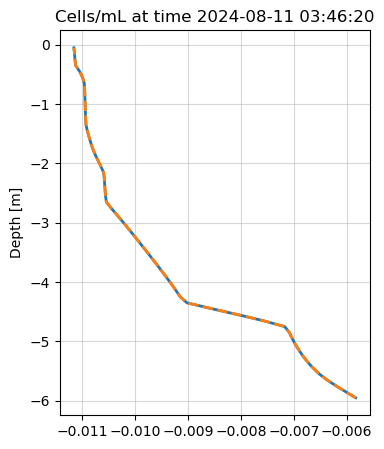

(9999, 60)


In [7]:

plt.figure(figsize=(4, 5))

i = -1 
diff = guess["algae1"][i,:] - truth["algae1"][i,:]

plt.plot(diff, -z, linewidth=2)
plt.plot(adj["lambda"][i,:]/2 , -z, '--',linewidth=2)
# plt.plot(flip(diff), -z, linewidth=2)
plt.title(f"Cells/mL at time %s" % dates[-1])
plt.ylabel('Depth [m]')
ax = plt.gca()
ax.grid(alpha=0.5)
plt.show()

print(adj["lambda"].shape)


In [69]:
# TURBULENT DIFFUSIVITY

frames = []

start = 0
end = 8998
spacing = 50 
times = [dates[i] for i in range(start, end, spacing)]
# Create a frame for each phase shift
for i in range(start, end, spacing):
    h1 = go.Scatter(x=hydro["Kz"][i,:], y=-z, name= "Turbulent Diffusivity", mode='lines', line=dict(width=2, color="blue"))  
    frames.append(go.Frame(data=[h1], name=str(dates[i])))

# Initial figure
h1 = go.Scatter(x=hydro["Kz"][i,:], y=-z, name= "Turbulent Diffusivity", mode='lines', line=dict(width=2, color="blue"))  
fig = go.Figure( data=[h1],
                layout=go.Layout(
                    title='TURBULENT DIFFUSIVITY',
                    xaxis=dict(range=[0, 0.01], title='Adjoint Variable [-]'),
                    yaxis=dict(range=[-6, 0], title='Water Depth (m)'),
                    updatemenus=[{
                    'type': 'buttons',
                    'showactive': False,
                    'buttons': [{
                        'label': 'Play',
                        'method': 'animate',
                        'args': [None, {
                            'frame': {'duration': 200, 'redraw': True},
                            'fromcurrent': True
                        }]
                    }]
                }],
                sliders=[{
                    'active': 0,
                    'steps': [{'label': t.strftime('%b/%d %H:%M'),'method': 'animate', 'args': [[str(t)], {'mode': 'immediate', 'frame': {'duration': 0}, 'transition': {'duration': 0}}]} for t in times]
                }]
            ),
    frames=frames
)
fig.show()


<xarray.Dataset> Size: 5MB
Dimensions:  (z: 60, time: 9999)
Coordinates:
  * z        (z) float32 240B 5.95 5.85 5.75 5.65 5.55 ... 0.35 0.25 0.15 0.05
  * time     (time) timedelta64[ns] 80kB 00:00:01 00:00:02 ... 02:46:38 02:46:39
Data variables:
    lambda   (time, z) float64 5MB ...


/tmp/ipykernel_1299565/2487831615.py:1: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds = xr.open_dataset('adjoint.nc')


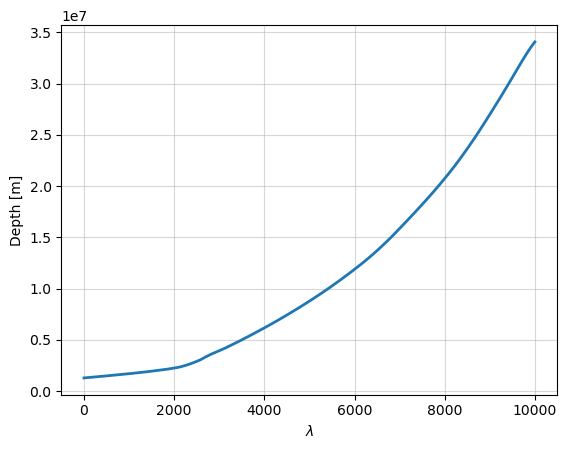

2024-08-10 05:33:00
2024-08-10 05:16:20
2024-08-10 04:59:40
2024-08-10 04:43:00
2024-08-10 04:26:20
2024-08-10 04:09:40
2024-08-10 03:53:00
2024-08-10 03:36:20
2024-08-10 03:19:40
2024-08-10 03:03:00
2024-08-10 02:46:20
2024-08-10 02:29:40
2024-08-10 02:13:00
2024-08-10 01:56:20
2024-08-10 01:39:40
2024-08-10 01:23:00
2024-08-10 01:06:20
2024-08-10 00:49:40
2024-08-10 00:33:00
2024-08-10 00:16:20


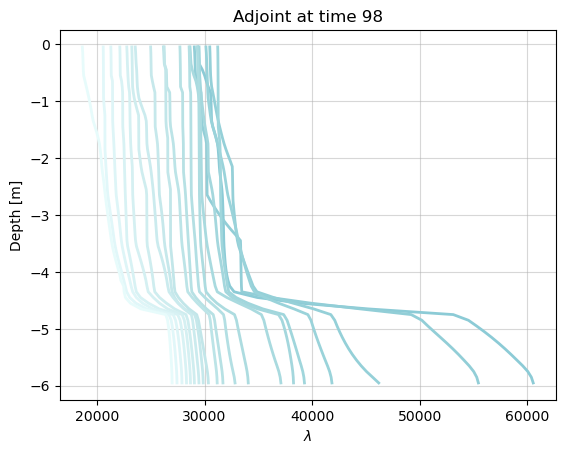

In [ ]:

ds = xr.open_dataset('adjoint.nc')

z = -ds['z'].values
time = ds['time'].values

plt.figure()
plt.plot(ds['lambda'].sum(dim='z'), linewidth=2)
plt.xlabel(r'$\lambda$')
plt.ylabel('Depth [m]')
ax = plt.gca()
ax.grid(alpha=0.5)
plt.show()




plt.figure()
for i in range(1998, 0, -100):
    print(dates[i])
    plt.plot(ds['lambda'].isel(time=i), z, color=cmo.cm.ice_r(i/10000), linewidth=2)
    # print("At time %d, sum(lambda) = %f" % (i, ds['lambda'].isel(time=i).sum()))
plt.title(f"Adjoint at time %d" % i)
plt.xlabel(r'$\lambda$')
plt.ylabel('Depth [m]')
ax = plt.gca()
# ax.set_xlim(-1e4,1e4)
ax.grid(alpha=0.5)
plt.show()


/tmp/ipykernel_1299565/4253105365.py:6: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds = xr.open_dataset('../forward_phyto/phyto_TRUTH.nc')


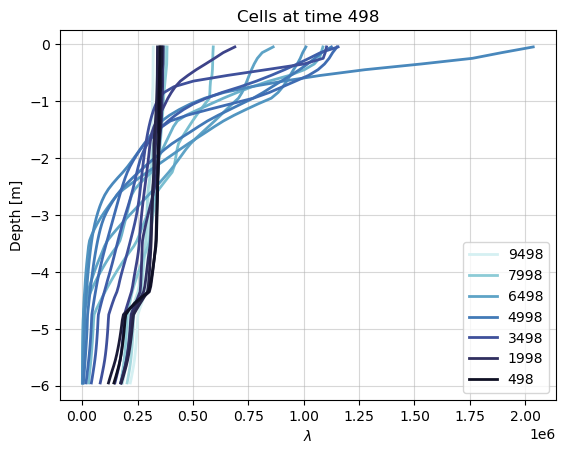

In [40]:
import matplotlib.pyplot as plt
import cmocean as cmo 



ds = xr.open_dataset('../forward_phyto/phyto_TRUTH.nc')

z = ds['z'].values
time = ds['time'].values


plt.figure()
for i in range(9998, 0, -500):
    if i%3 == 0 :
        plt.plot(ds['algae1'].isel(time=i), -z, color=cmo.cm.ice(i/10000), linewidth=2, label=i)
    else : 
        plt.plot(ds['algae1'].isel(time=i), -z, color=cmo.cm.ice(i/10000), linewidth=2)
plt.title(f"Cells at time %d" % i)
plt.xlabel(r'$\lambda$')
plt.ylabel('Depth [m]')
ax = plt.gca()
ax.legend()
# ax.set_xlim(0,4)
ax.grid(alpha=0.5)
plt.show()

At time 9998, sum(lambda) = 0.503609
At time 9498, sum(lambda) = 0.251445
At time 8998, sum(lambda) = 0.103097
At time 8498, sum(lambda) = 0.213268
At time 7998, sum(lambda) = 0.164009
At time 7498, sum(lambda) = 0.132224
At time 6998, sum(lambda) = 0.036655
At time 6498, sum(lambda) = 0.009403
At time 5998, sum(lambda) = 0.013678
At time 5498, sum(lambda) = 0.002634
At time 4998, sum(lambda) = 0.004618
At time 4498, sum(lambda) = 0.006982
At time 3998, sum(lambda) = 0.003122
At time 3498, sum(lambda) = 0.009544
At time 2998, sum(lambda) = 0.007737
At time 2498, sum(lambda) = 0.166115
At time 1998, sum(lambda) = 0.126441
At time 1498, sum(lambda) = 0.292678
At time 998, sum(lambda) = 0.359232
At time 498, sum(lambda) = 0.447689


/tmp/ipykernel_1702945/913905150.py:8: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  ds = xr.open_dataset('../run_hydro/HYDRO.nc')


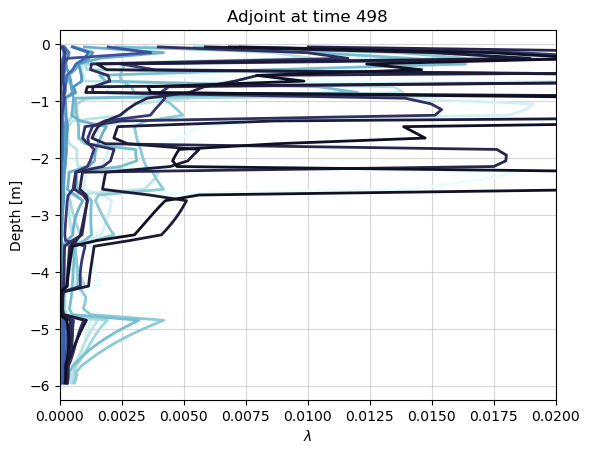

In [ ]:
import matplotlib.pyplot as plt
import cmocean as cmo 

z = ds['z'].values
time = ds['time'].values


ds = xr.open_dataset('../run_hydro/HYDRO.nc')

plt.figure()
for i in range(9998, 0, -200):
    plt.plot(ds['Kz'].isel(time=i), -z, color=cmo.cm.ice(i/10000), linewidth=2)
    print("At time %d, sum(lambda) = %f" % (i, ds['Kz'].isel(time=i).sum()))
plt.title(f"Adjoint at time %d" % i)
plt.xlabel(r'$\lambda$')
plt.ylabel('Depth [m]')
ax = plt.gca()
ax.set_xlim(0,2e-2)
ax.grid(alpha=0.5)
plt.show()